In [1]:
# %pip install nbformat
# !pip install nltk
# !pip install -U kaleido

In [2]:
# Import dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os

In [3]:
# Display settings for better readability
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 10)  # Display only the first 10 rows in output

In [4]:
# Reading all xlsx files
SF_Reports_df = pd.read_excel('Salesforce_20240826_ReportsExport.xlsx')

In [5]:
#Display column names
print(SF_Reports_df.columns)

Index(['CreatedById', 'CreatedBy', 'CreatedDate', 'Description',
       'DeveloperName', 'FolderName', 'Format', 'ReportId', 'IsDeleted',
       'LastModifiedById', 'LastModifiedBy', 'LastModifiedDate',
       'LastReferencedDate', 'LastRunDate', 'LastViewedDate', 'ReportName',
       'NamespacePrefix', 'OwnerId', 'Owner', 'SystemModstamp'],
      dtype='object')


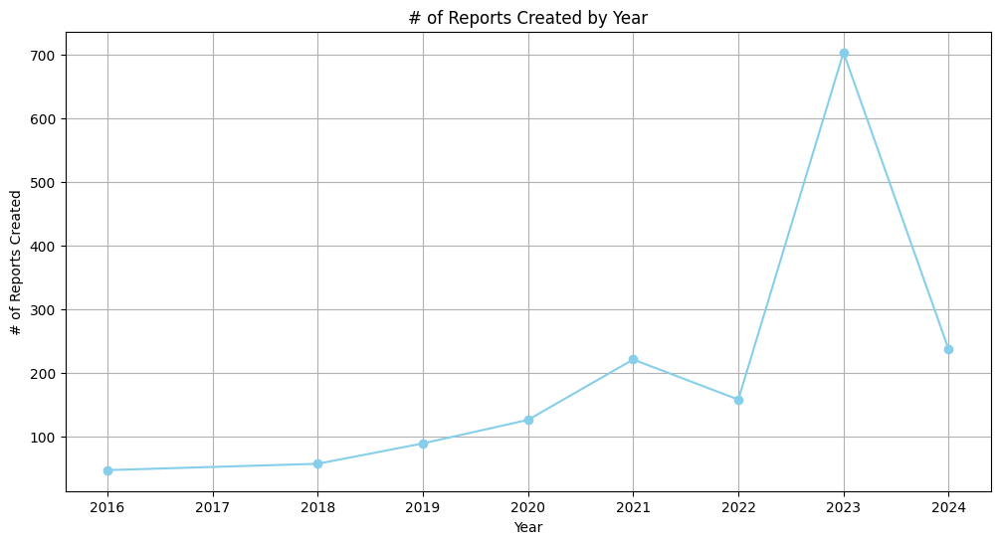

In [6]:
# total number of reports created each year
SF_Reports_df['Year'] = SF_Reports_df['CreatedDate'].dt.year
reports_by_year = SF_Reports_df.groupby('Year').size().reset_index(name='Number of Reports Created')

# Plotting the line chart
plt.figure(figsize=(12, 6))
plt.plot(reports_by_year['Year'], reports_by_year['Number of Reports Created'], marker='o', color='skyblue')
plt.title('# of Reports Created by Year')
plt.xlabel('Year')
plt.ylabel('# of Reports Created')
plt.grid(True)
plt.show()

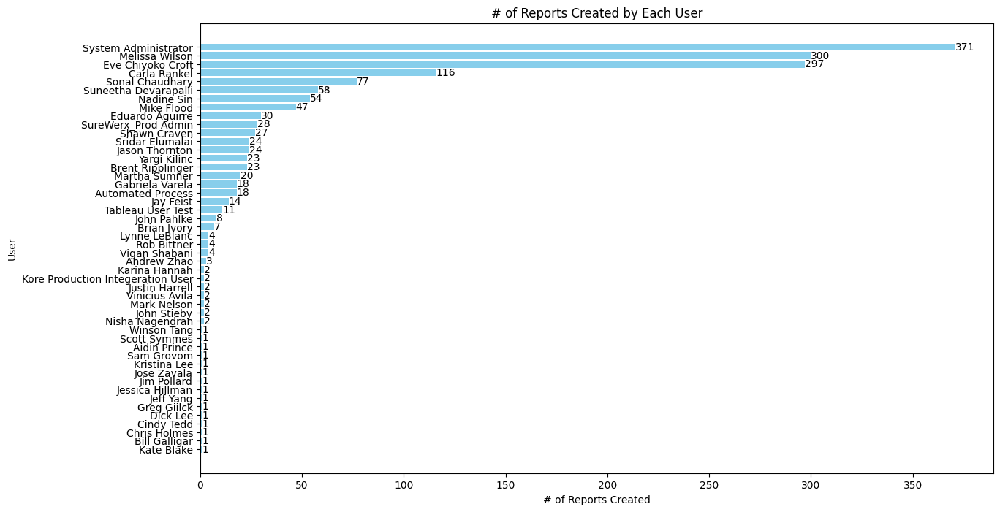

In [7]:
# Grouping the data by `CreatedBy` and counting the number of records created by each user
created_by = SF_Reports_df.groupby('CreatedBy').size().reset_index(name='Number of Reports Created')

# Sorting the data in descending order
created_by = created_by.sort_values(by='Number of Reports Created', ascending=False)

# Plotting the horizontal bar chart
plt.figure(figsize=(14, 8))
bars = plt.barh(created_by['CreatedBy'], created_by['Number of Reports Created'], color='skyblue')
plt.title('# of Reports Created by Each User')
plt.xlabel('# of Reports Created')
plt.ylabel('User')

# Adding the total number of reports created at the end of each bar
for bar in bars:
    plt.text(
        bar.get_width(), 
        bar.get_y() + bar.get_height()/2, 
        f'{int(bar.get_width())}', 
        va='center'
    )

plt.gca().invert_yaxis()  # Inverting y-axis to display in descending order
plt.show()


In [8]:
# looking to column `ReportName` and 

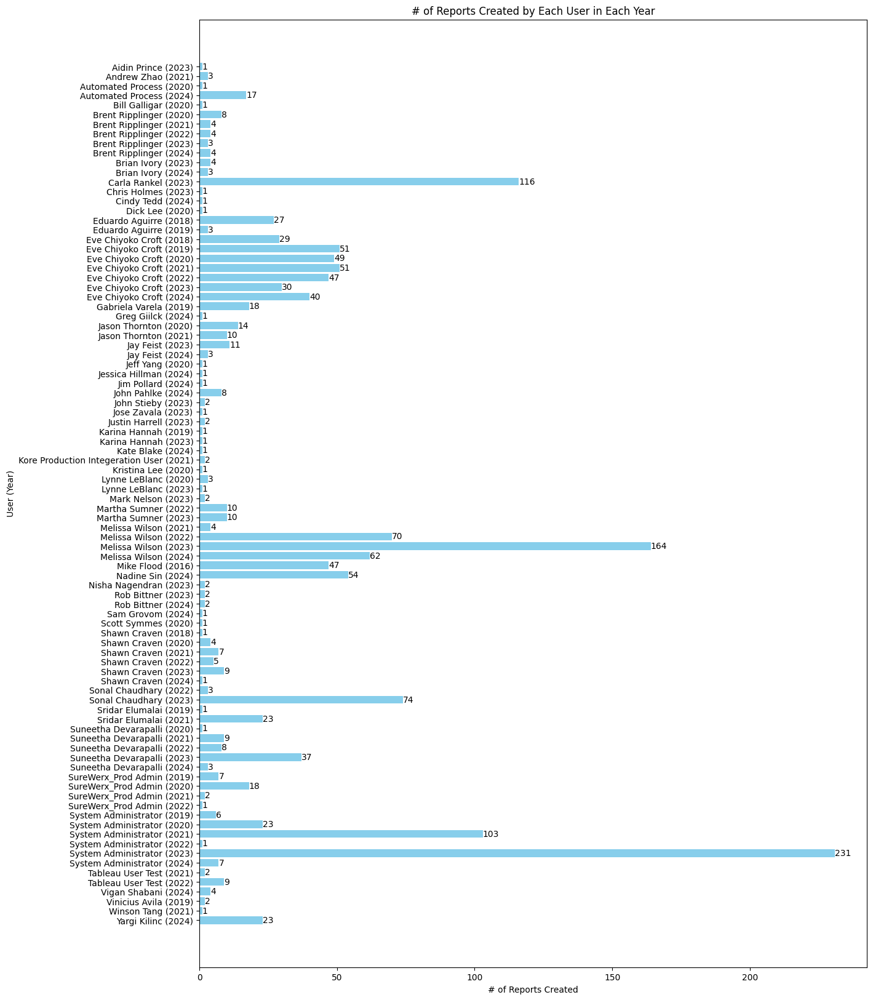

In [9]:
# Extracting the year from the `CreatedDate` column
SF_Reports_df['Year'] = SF_Reports_df['CreatedDate'].dt.year

# Grouping the data by `CreatedBy` and `Year` and counting the number of records created by each user each year
created_by_year = SF_Reports_df.groupby(['CreatedBy', 'Year']).size().reset_index(name='Number of Reports Created')

# Sorting the data in descending order by 'CreatedBy' and then by 'Year'
created_by_year = created_by_year.sort_values(by=['CreatedBy', 'Year'], ascending=[True, True])

# Creating a new column that combines `CreatedBy` and `Year` for plotting
created_by_year['User-Year'] = created_by_year['CreatedBy'] + ' (' + created_by_year['Year'].astype(str) + ')'

# Plotting the horizontal bar chart
plt.figure(figsize=(14, 20))
bars = plt.barh(created_by_year['User-Year'], created_by_year['Number of Reports Created'], color='skyblue')
plt.title('# of Reports Created by Each User in Each Year')
plt.xlabel('# of Reports Created')
plt.ylabel('User (Year)')

# Adding the total number of reports created at the end of each bar
for bar in bars:
    plt.text(
        bar.get_width(),
        bar.get_y() + bar.get_height() / 2,
        f'{int(bar.get_width())}',
        va='center'
    )

plt.gca().invert_yaxis()  # Inverting y-axis to display in descending order
plt.show()




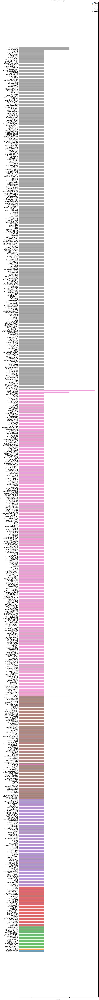

In [10]:
# Ensuring 'LastRunDate' is in datetime format
SF_Reports_df['LastRunDate'] = pd.to_datetime(SF_Reports_df['LastRunDate'], errors='coerce')

# Extracting the year from 'LastRunDate'
SF_Reports_df['LastRunYear'] = SF_Reports_df['LastRunDate'].dt.year

# Filtering out records where 'LastRunYear' is not null
SF_Reports_df = SF_Reports_df[SF_Reports_df['LastRunYear'].notnull()]

# Grouping by 'ReportName' and 'LastRunYear' to count the number of times each report was run per year
report_run_counts_by_year = SF_Reports_df.groupby(['ReportName', 'LastRunYear']).size().reset_index(name='RunCount')

# Sorting to find the lowest run reports per year
report_run_counts_by_year = report_run_counts_by_year.sort_values(by=['LastRunYear', 'RunCount'], ascending=[True, True])

# Plotting the horizontal bar chart for each year
plt.figure(figsize=(20, 250))

# Looping through each year and plotting the data for that year
for year in report_run_counts_by_year['LastRunYear'].unique():
    yearly_data = report_run_counts_by_year[report_run_counts_by_year['LastRunYear'] == year]
    plt.barh(yearly_data['ReportName'], yearly_data['RunCount'], label=f'Year {year}', alpha=0.7)

plt.title('Lowest Run Report Names by Year')
plt.xlabel('Number of Runs')
plt.ylabel('Report Name')
plt.legend(title='Year')
plt.show()

# save this in csv
report_run_counts_by_year.to_csv('report_run_counts_by_year.csv', index=False)


In [11]:
# Ensure 'CreatedDate', 'LastRunDate', and 'LastModifiedDate' are in datetime format
SF_Reports_df['CreatedDate'] = pd.to_datetime(SF_Reports_df['CreatedDate'], errors='coerce')
SF_Reports_df['LastRunDate'] = pd.to_datetime(SF_Reports_df['LastRunDate'], errors='coerce')
SF_Reports_df['LastModifiedDate'] = pd.to_datetime(SF_Reports_df['LastModifiedDate'], errors='coerce')

# Calculate the most recent activity date between 'LastRunDate' and 'LastModifiedDate'
SF_Reports_df['LastActivityDate'] = SF_Reports_df[['LastRunDate', 'LastModifiedDate']].max(axis=1)

# Calculate the lifespan in days since creation until the last activity
SF_Reports_df['LifespanDays'] = (SF_Reports_df['LastActivityDate'] - SF_Reports_df['CreatedDate']).dt.days

# Filter reports that have not been updated or run in the last year (365 days)
reports_not_updated_recently = SF_Reports_df[SF_Reports_df['LastActivityDate'] < pd.Timestamp.now() - pd.Timedelta(days=365)]

# Display the reports that have not been updated or run recently
print(reports_not_updated_recently[['ReportName', 'CreatedDate', 'LastRunDate', 'LastModifiedDate', 'LifespanDays']])

# output as csv
reports_not_updated_recently.to_csv('reports_not_updated_recently.csv', index=False)



                                   ReportName         CreatedDate  \
29                   0 Accounts Event Listing 2019-03-15 07:29:50   
30       001_Canada Sales_Users_Report_Re Org 2021-08-11 08:58:11   
32          002_ADA Sales_Users_Report_Re Org 2021-08-11 09:02:03   
33              002_Order Details Testing -IK 2021-09-08 10:48:54   
34    2021 Show Customers on Traction Booking 2021-08-04 14:52:17   
...                                       ...                 ...   
1632                 Won Opportunities Amount 2023-07-28 17:00:17   
1634           YOY Leads report - All sources 2022-01-10 11:53:41   
1635                         YOY Pardot Score 2023-05-09 07:32:22   
1636                     YTD  Comparison - CA 2021-06-02 05:43:00   
1637                      YTD Comparison - US 2021-06-15 03:21:20   

             LastRunDate    LastModifiedDate  LifespanDays  
29   2021-11-15 10:45:34 2019-03-15 08:19:17           976  
30   2021-08-19 15:13:06 2021-08-11 08:58:11     

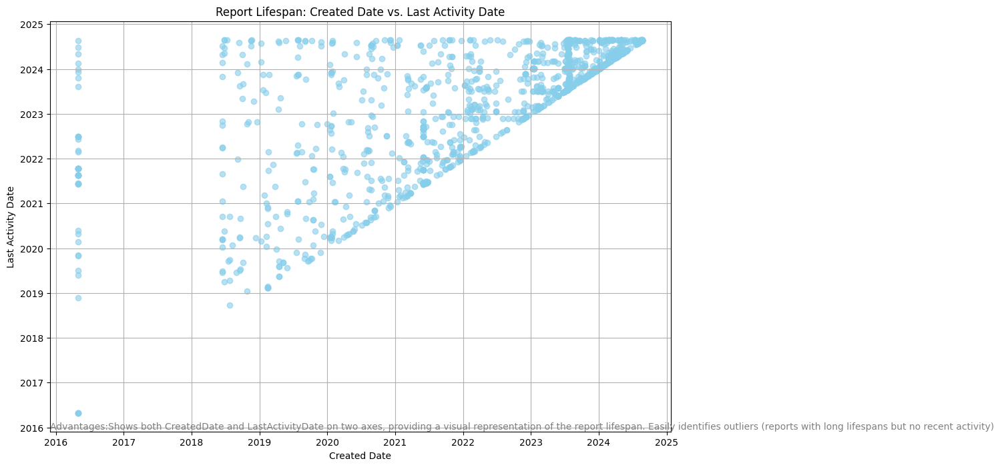

In [12]:
# Ensure all necessary columns are datetime formatted as before
SF_Reports_df['CreatedDate'] = pd.to_datetime(SF_Reports_df['CreatedDate'], errors='coerce')
SF_Reports_df['LastRunDate'] = pd.to_datetime(SF_Reports_df['LastRunDate'], errors='coerce')
SF_Reports_df['LastModifiedDate'] = pd.to_datetime(SF_Reports_df['LastModifiedDate'], errors='coerce')

# Calculate the most recent activity date between 'LastRunDate' and 'LastModifiedDate'
SF_Reports_df['LastActivityDate'] = SF_Reports_df[['LastRunDate', 'LastModifiedDate']].max(axis=1)

# Plotting the scatter plot to show lifespan
plt.figure(figsize=(12, 8))
plt.scatter(SF_Reports_df['CreatedDate'], SF_Reports_df['LastActivityDate'], alpha=0.6, color='skyblue')

# add this note: `Advantages:Shows both CreatedDate and LastActivityDate on two axes, providing a visual representation of the report lifespan. Easily identifies outliers (reports with long lifespans but no recent activity)` to the right lower corner of the plot
plt.text(plt.xlim()[0], plt.ylim()[0], 'Advantages:Shows both CreatedDate and LastActivityDate on two axes, providing a visual representation of the report lifespan. Easily identifies outliers (reports with long lifespans but no recent activity)', fontsize=10, color='gray', va='bottom')

plt.title('Report Lifespan: Created Date vs. Last Activity Date')
plt.xlabel('Created Date')
plt.ylabel('Last Activity Date')
plt.grid(True)
plt.show()


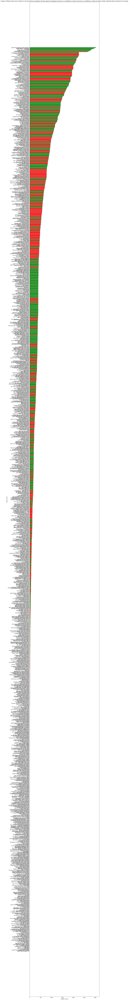

In [13]:
# Ensure 'CreatedDate', 'LastRunDate', and 'LastModifiedDate' are in datetime format
SF_Reports_df['CreatedDate'] = pd.to_datetime(SF_Reports_df['CreatedDate'], errors='coerce')
SF_Reports_df['LastRunDate'] = pd.to_datetime(SF_Reports_df['LastRunDate'], errors='coerce')
SF_Reports_df['LastModifiedDate'] = pd.to_datetime(SF_Reports_df['LastModifiedDate'], errors='coerce')

# Calculate the most recent activity date between 'LastRunDate' and 'LastModifiedDate'
SF_Reports_df['LastActivityDate'] = SF_Reports_df[['LastRunDate', 'LastModifiedDate']].max(axis=1)

# Calculate lifespan in days since creation until the last activity
SF_Reports_df['LifespanDays'] = (SF_Reports_df['LastActivityDate'] - SF_Reports_df['CreatedDate']).dt.days

# Determine active and inactive status based on a threshold (e.g., 365 days)
threshold_days = 365
SF_Reports_df['Status'] = SF_Reports_df['LastActivityDate'].apply(lambda x: 'Active' if pd.Timestamp.now() - x <= pd.Timedelta(days=threshold_days) else 'Inactive')

# Sorting the DataFrame by 'LifespanDays' in descending order
sorted_reports = SF_Reports_df.sort_values(by='LifespanDays', ascending=False)

# Assign colors based on status
colors = sorted_reports['Status'].map({'Active': 'green', 'Inactive': 'red'})

# Plotting the color-coded bar chart
plt.figure(figsize=(14, 200))
plt.barh(sorted_reports['ReportName'], sorted_reports['LifespanDays'], color=colors)
plt.title('Lifespan of Reports (Days Since Creation to Last Activity)This visualization will show reports active(green:recently run or modified) vs inactive (red:not run or modified in a while), for better insights regarding report maintenance and usage.')
plt.xlabel('Lifespan in Days')
plt.ylabel('Report Name')
plt.gca().invert_yaxis()  # Invert y-axis to have the longest lifespan on top
plt.show()


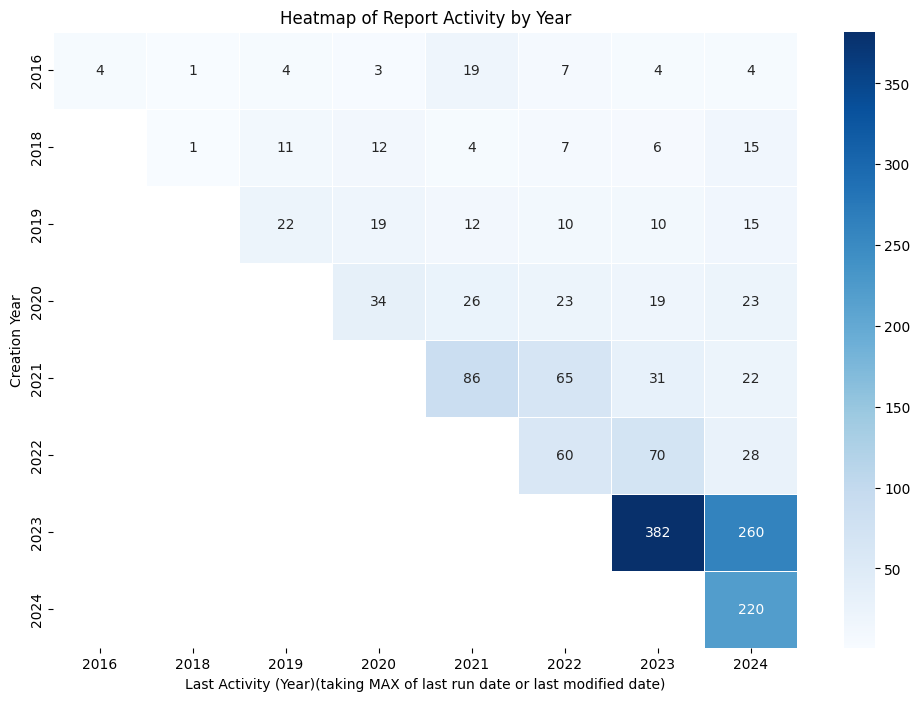

In [14]:
# Ensure 'CreatedDate' and 'LastActivityDate' are in datetime format
SF_Reports_df['CreatedDate'] = pd.to_datetime(SF_Reports_df['CreatedDate'], errors='coerce')
SF_Reports_df['LastActivityDate'] = pd.to_datetime(SF_Reports_df['LastActivityDate'], errors='coerce')

# Extract the year from 'CreatedDate' and 'LastActivityDate'
SF_Reports_df['CreatedYear'] = SF_Reports_df['CreatedDate'].dt.year
SF_Reports_df['LastActivityYear'] = SF_Reports_df['LastActivityDate'].dt.year

# Create a pivot table to show activity over time by year
heatmap_data = SF_Reports_df.pivot_table(index='CreatedYear', columns='LastActivityYear', 
                                         values='ReportName', aggfunc='count')

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, fmt='g', cmap='Blues', linewidths=.5)
plt.title('Heatmap of Report Activity by Year')
plt.xlabel('Last Activity (Year)(taking MAX of last run date or last modified date)')
plt.ylabel('Creation Year')
plt.show()


In [15]:
# Ensure 'CreatedDate' and 'LastActivityDate' are in datetime format
SF_Reports_df['CreatedDate'] = pd.to_datetime(SF_Reports_df['CreatedDate'], errors='coerce')
SF_Reports_df['LastActivityDate'] = pd.to_datetime(SF_Reports_df['LastActivityDate'], errors='coerce')

# Extract the year from 'CreatedDate' and 'LastActivityDate'
SF_Reports_df['CreatedYear'] = SF_Reports_df['CreatedDate'].dt.year
SF_Reports_df['LastActivityYear'] = SF_Reports_df['LastActivityDate'].dt.year

# Create a pivot table to show activity over time by year
heatmap_data = SF_Reports_df.pivot_table(index='CreatedYear', columns='LastActivityYear', 
                                         values='ReportName', aggfunc='count')

# # Save the pivot table (heatmap data) to a CSV file
# heatmap_data.to_csv('heatmap_data_report_activity.csv')

# Optional: Display the first few rows of the pivot table to verify
print(heatmap_data.head())


LastActivityYear  2016  2018  2019  2020  2021  2022  2023  2024
CreatedYear                                                     
2016               4.0   1.0   4.0   3.0  19.0   7.0   4.0   4.0
2018               NaN   1.0  11.0  12.0   4.0   7.0   6.0  15.0
2019               NaN   NaN  22.0  19.0  12.0  10.0  10.0  15.0
2020               NaN   NaN   NaN  34.0  26.0  23.0  19.0  23.0
2021               NaN   NaN   NaN   NaN  86.0  65.0  31.0  22.0


In [16]:
# Ensure 'CreatedDate' and 'LastActivityDate' are in datetime format
SF_Reports_df['CreatedDate'] = pd.to_datetime(SF_Reports_df['CreatedDate'], errors='coerce')
SF_Reports_df['LastActivityDate'] = pd.to_datetime(SF_Reports_df['LastActivityDate'], errors='coerce')

# Extract the year from 'CreatedDate' and 'LastActivityDate'
SF_Reports_df['CreatedYear'] = SF_Reports_df['CreatedDate'].dt.year
SF_Reports_df['LastActivityYear'] = SF_Reports_df['LastActivityDate'].dt.year

# Create a detailed DataFrame including 'ReportId', 'ReportName', 'CreatedBy', 'FolderName', 'CreatedYear', and 'LastActivityYear'
detailed_report_data = SF_Reports_df[['ReportId', 'ReportName', 'CreatedBy', 'FolderName', 'CreatedYear', 'LastActivityYear']]

# Save the detailed data to a CSV file
detailed_report_data.to_csv('all_time_detailed_salesforce_report_activity_data.csv', index=False)

# Optional: Display the first few rows of the detailed data to verify
print(detailed_report_data.head())




             ReportId                           ReportName  \
0  00O1Q000007WRpJUAW                           # of Leads   
1  00O8W00000388gIUAQ                   # of Opportunities   
2  00O8W00000388T1UAI          # of Opportunities by Stage   
3  00O3x000009ZHXbEAO  % of Accounts without Opportunities   
4  00O3x000009ZHLfEAO  % of Opportunities without Activity   

              CreatedBy              FolderName  CreatedYear  LastActivityYear  
0     Eve Chiyoko Croft  SureWerx Sales Reports         2019              2024  
1  System Administrator  SureWerx Sales Reports         2023              2024  
2       Sonal Chaudhary  SureWerx Sales Reports         2023              2024  
3        Jason Thornton          Public Reports         2020              2024  
4        Jason Thornton          Public Reports         2020              2024  
